# Hopping Kangaroo Sketch Challenge Problem

Once upon a time, an ambitious engineer was tasked with inventing a "kangaroo-maker" — a marvelous machine that could conjure up kangaroos in all their bouncy glory: hopping, boxing, napping, you name it. But somewhere along the way, wires got crossed (literally), and instead of producing kangaroos, the machine started… drawing them. Perfectly neat outlines of every kangaroo pose you could imagine appeared on paper, but not a single marsupial ever hopped out.
And so, the legend of the "Kangaroo-Maker-That-Only-Makes-Kangaroo-DRAWINGS" was born.

Your task: Design 2D planar linkage mechanisms that can trace three target kangaroo-paths. These curves are your blueprints — now go build some mechanisms!

### The three targets

The silhouette we are really after is the kangaroo meme above. But here is the honest warning up front:

> **⚠️ Kangaroo 3 (the full meme) is intrinsically very hard — do not expect a good fit.**
> This is not a matter of tuning your optimizer harder or running more generations. The ears and the tail are thin, sharp protrusions that a linkage coupler point essentially cannot reach without the rest of the curve falling apart. We include it *on purpose*, as an illustration of a fundamental limit rather than a target you are expected to nail.

So why three targets? Because the point here is to build intuition for **which shapes are easy to draw with a linkage and which are not** — smooth, convex-ish, regular outlines are easy, while thin protrusions, sharp tips and deep concavities are hard. We give you the same character at three levels of geometric regularity:

| Target |  Description |
| --- |  --- |
| Kangaroo 1 |  **Easiest.** The round-body version — ears and tail removed *and* the body smoothed into a rounded blob. |
| Kangaroo 2 |  **Medium.** Ears and tail removed, but the original snout/belly/feet profile is kept. |
| Kangaroo 3 |   **Hardest (expect a poor fit).** The full kangaroo meme, ears and tail included. |

<table><tr>
<td><img src="https://i.ibb.co/FkLv0nV7/kangaroo-round.png" width="230"></td>
<td><img src="https://i.ibb.co/6JrvCgVt/kangaroo-no-ear-no-tail.png" width="230"></td>
<td><img src="https://i.ibb.co/23L1gFRw/kangaroo.png" width="230"></td>
</tr><tr>
<td align="center">Kangaroo 1 (round body)</td>
<td align="center">Kangaroo 2 (no ears, no tail)</td>
<td align="center">Kangaroo 3 (full meme)</td>
</tr></table>

Because the harder targets cannot be fitted as tightly, each one is scored against its **own reference point** rather than a single shared one (see the Instructions section below), so that a sensible-but-imperfect solution still earns credit.


In [ ]:
%%capture
!git clone https://github.com/HuaiboChen/2.156-CP1.git
!mv ./2.156-CP1/* .
!rm -rf ./2.156-CP1
!pip install pymoo==0.6.1 svgpath2mpl
# pip install jax # install jax if you are in local computer

In [65]:
import os
os.environ["JAX_PLATFORMS"] = "cpu"  # Disable GPU for JAX (Remove if you want to use GPU)

import numpy as np
import matplotlib.pyplot as plt
import random

# deteministic random numbers
np.random.seed(0)
random.seed(0)

In [69]:
import numpy as np
import pymoo
import sys

print("Python:", sys.version)
print("NumPy:", np.__version__)
print("pymoo:", pymoo.__version__)

Python: 3.14.5 (main, May 10 2026, 10:21:34) [Clang 17.0.0 (clang-1700.6.4.2)]
NumPy: 2.5.3
pymoo: 0.6.1


In this challenge problem you are tasked with synthesizing planar linkage mechanisms to trace three different output shapes accurately while also minimizing the total material used for the mechanisms.

We have given you the outlines of the kangaroos we want in a numpy file called `kangaroo_target_curves.npy` which you can load using numpy and plot using matplotlib. The array has shape `(3, 200, 2)` — three target curves, each sampled at 200 points in 2D, ordered from easiest to hardest:

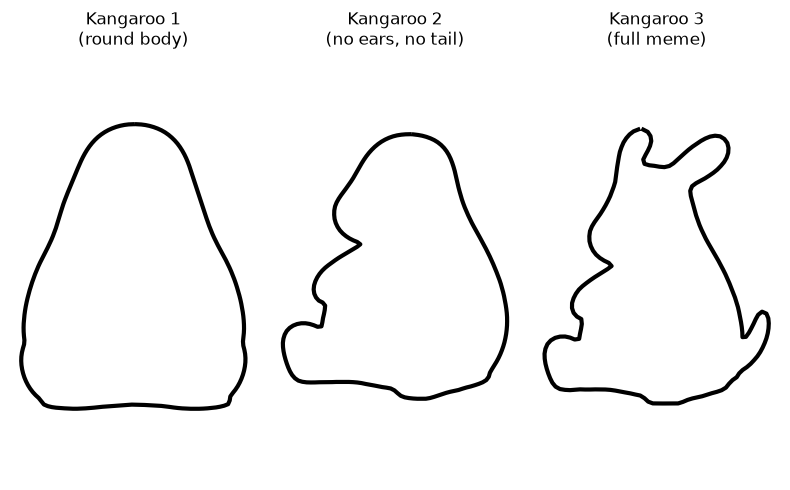

In [41]:
target_curves = np.load('kangaroo_target_curves.npy')

# Names of the three targets, ordered easiest -> hardest (see the intro above)
TARGET_NAMES = [
    'Kangaroo 1 (round body)',
    'Kangaroo 2 (no ears, no tail)',
    'Kangaroo 3 (full meme)',
]

# Difficulty note: the targets go from convex and smooth (Kangaroo 1) to sharply
# curved with deep concavities (Kangaroo 3). Kangaroo 3 is intrinsically hard for
# a linkage to trace and is not expected to fit well.

fig, axs = plt.subplots(1, 3, figsize=(8, 5))

for i in range(target_curves.shape[0]):
    x_coords = target_curves[i][:, 0]
    y_coords = target_curves[i][:, 1]

    axs[i].plot(x_coords, y_coords, color='black', linewidth=3)
    axs[i].set_title(TARGET_NAMES[i].replace(' (', '\n('))
    axs[i].axis('equal')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

<font color="red" size="8"><b>WARNING: </b></font> If you plan to work on this notebook in colab we would like to warn you that if you do not download any files you save or save the changes separately, upon the runtime being killed either by you closing the tab/browser or by timing out due to inactivity you WILL LOSE YOUR FILES AND WORK. It is highly recommeneded that you make a local python environment to work.

## Overview
The first portion of this notebook will help you understand the linkage design problem and the way we parameterize each linkage design. It will also discuss deliverables and submission instructions. In the second half of this notebook we provide you with a working implementation that you can use as a baseline.

**IMPORTANT:** We also provide numerous helper functions in the linkage_utils. We touch on most of these functions in this notebook but some *very useful* functions will be covered in the advanced notebook!

### Project Files and Functions Provided:

All files as well as helper functions and further information can be found in the Github repository of this challenge problem:
[Github Repo](https://github.com/ahnobari/2155-Optimization-Challenge-Problem)

### The Optimization Problem
<div width="100%"><img src="https://i.imgur.com/69xDuZc.png" alt="Path Synthesis Problem" width="60%" style="margin:auto;display:block"></div>

The problem we try to solve in this challenge problem is similar to the one in the optimization demo. The goal in this problem is to design a linkage mechanism that can trace a target curve. In addition to this we also want to minimize material usage. We will discuss the full problem later in the notebook but before we get to that, let us review how we represented linkage mechanisms computationally.


### Mechanism Representation
Here we will briefly discuss how we can represent linkage mechanisms. In this demonstration we will represent linkage mechanisms as graphs. A graph is represented as a set of nodes (e.g., $N = \{1,2,3,\ldots,N\}$), and set of edges, that describe how nodes are connected to each other (e.g., $E=\{(1,2), (5,2), \ldots \}$). Graphs can also include features associated with each node (e.g., initial positions of joints in our example of mechanisms).

To see how this works take the mechanism below:

<div width="100%"><img src="https://i.ibb.co/qsPC0gC/2021-09-13-0hl-Kleki.png" alt="Path Synthesis Problem" width="40%" style="margin:auto;display:block"></div>


We can see that we have 5 joints, which we will represent as 5 nodes, $N=\{0,1,2,3,4\}$, and we can represent the linkages as edges in the graph, which give us the edges $E=\{(0,2),(1,3),(2,3),(2,4),(3,4)\}$. Note that edges in this graph do not have directions so $(0,2)$ and $(2,0)$ are identical. To keep things neat so we put the smaller index first. Besides the basic graph describing the mechanisms structure, we also see that all nodes have an initial position in 2D space. Nodes $0$ and $1$ are fixed and will remain in place, while the others will move. We will describe these as node features. This means each node will have a 2D initial position and a binary feature describing whether it is fixed or not. We can also see that one of the linkages is highlighed yellow. This is the linkage that is rotated by the actuator. We will also store this information.

In practice the above description boils down to a few (Design) variables in python which we use to describe the mechanism:

- **Initial Positions** `x0`: A 2D array of size $N \times 2$, holding the initial positions of the $N$ joints in the mechanism.
- **Linkages** `edges`: A 2D array of ***integer*** pairs, with shape $E \times 2$ holding the pairs of node indecies from two nodes that are connected to each other by an edge.
- **Fixed Joints** `fixed_joints`: A list of node indices that are fixed.
- **Motor** `motor`: A tuple of integers, which is equivalent to the pair of node indices associated with the actuated edge.

This representation is fine, however sometimes instead of explicitly specifying edges a different approach is used to describe graph connectivity. The so called <b>Adjacency/Connectivity Matrix</b> is another way to represent the edges of a graph. A linkage mechanisms structure can therefore be represented using a matrix of connectivity ($C$), which is similar to the adjacency matrix in graphs (networks). The connectivity matrix for a mechanisms with $N$ nodes is a symmetric $N\times N$ matrix with each row and column representing each node and its connections to other nodes. Take the example below:

<img src="https://transportgeography.org/wp-content/uploads/simple_connectivity_matrix2.png" width="100%" style="max-width: 700px; display:block; margin:auto;" alt="Connectivity Matrix">

For Node A we use the first row/column of the matrix and we see that A is connected to B (which is represented by the second row/column). To represent this connection in the connectivity matrix we will set the value of the $(1,2)$ and $(2,1)$ elements of the matrix to be 1. Similarly any time any nodes $i$ and $j$ are connected with an edge we set the value of the $(i,j)$ and $(j,i)$ elements to be 1 and 0 if the nodes are not connected. We will use this kind of representation in the advanced starter notebook to show how this can help us define a problem for GA that generates the structure of the mechanism as well.

### Visualizing Mechanisms
In the code base we provide a `MechanismVisualizer` class which you can use to visualize mechanisms. Let's define a four-bar mechanism below and visualize it using this class.

In [42]:
from LINKS.Visualization import MechanismVisualizer

To use this, first create an instance of the visualizer, then call this instance with your mechanisms representation. Below is an example:

<Axes: >

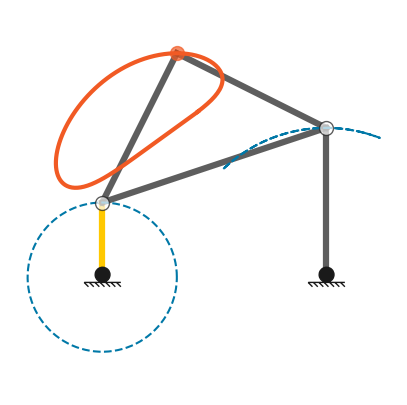

In [43]:
visualizer = MechanismVisualizer()

# Define the variables for the mechanism
x0 = np.array([[0.3,0.2],
               [0.6,0.2],
               [0.3,0.3],
               [0.6,0.4],
               [0.4,0.5]])

# Define the connectivity of the mechanism
edges = np.array([[0,2],
                  [1,3],
                  [2,3],
                  [2,4],
                  [3,4]])

# Define the fixed nodes
fixed_joints = np.array([0,1])

# actuator
motor = np.array([0,2])

plt.figure(figsize=(5,5))
visualizer(x0, edges, fixed_joints, motor, ax=plt.gca())

The `MechanismVisualizer` class will solve the mechanism everytime. But if we want to access the full simulations of the mechanisms we will need to use another class, the `MechanismSolver` class. Below is an example of this:

In [44]:
from LINKS.Kinematics import MechanismSolver

In [45]:
solver = MechanismSolver(
    device = 'cpu' # device to run the simulation on (cpu or gpu)
)

solution = solver(x0, edges, fixed_joints, motor)

print("The shape of the solution is:", solution.shape)  # Should be (num_joints, timesteps, 2)

The shape of the solution is: (5, 200, 2)


We can grab joint 4's solution and visualize it:

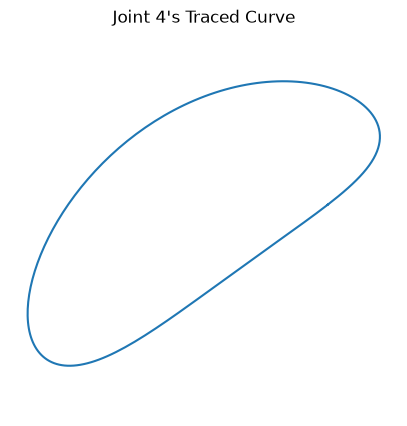

In [46]:
# the target joints solution
traced_curve = solution[4]  # Joint 4's trajectory over time

plt.figure(figsize=(5,5))
plt.plot(traced_curve[:,0], traced_curve[:,1])
plt.axis('equal')
plt.title("Joint 4's Traced Curve")
plt.axis('off')
plt.show()

Now that we have a traced curve, how do we compare with the target curve? To do this we provide another class called `CurveEngine` which has some useful functions which you can use to do this.

In [47]:
from LINKS.Geometry import CurveEngine

The functions that we most case about are the `compare_curves` and `visualize_comparison`, and `visualize_alignment`.

In [48]:
curve_processor = CurveEngine(
    device='cpu'
)

Now let's visualize the alignment process:

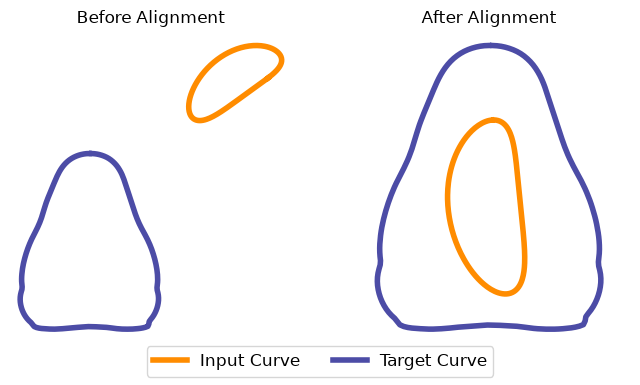

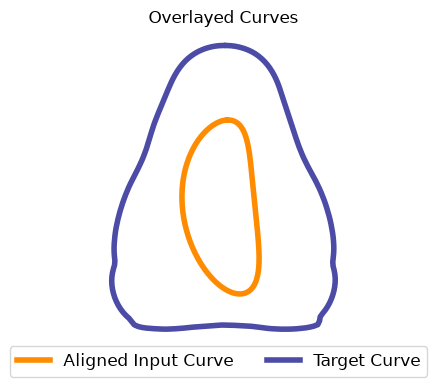

In [49]:
curve_processor.visualize_alignment(traced_curve, target_curves[0])
curve_processor.visualize_comparison(traced_curve, target_curves[0])

Note that the visualizations and calculations can be done for a batch of inputs as well:

In [50]:
distances = curve_processor.compare_curves(
            traced_curve[None].repeat(target_curves.shape[0], axis=0), # repeat the traced curve for each target curve
            target_curves)

print("Distances to all target curves (unnormalized):", distances)

Distances to all target curves (unnormalized): [3.2591598 2.8748262 2.2580538]


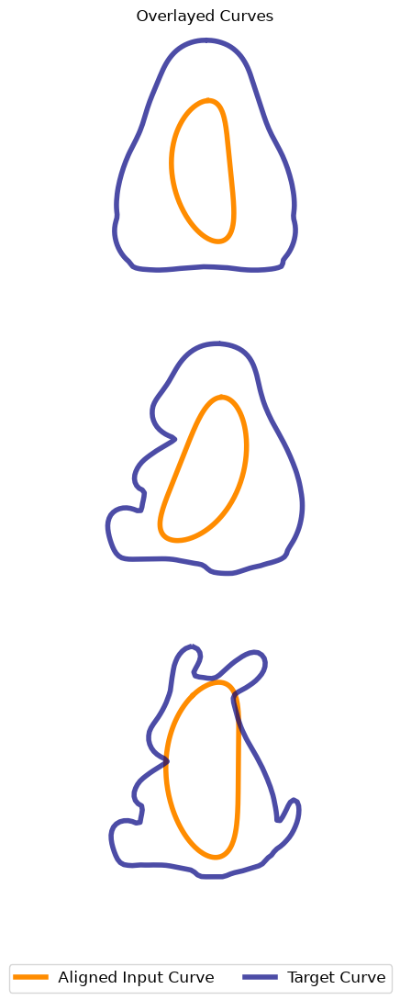

In [51]:
curve_processor.visualize_comparison(
            traced_curve[None].repeat(target_curves.shape[0], axis=0), # repeat the traced curve for each target curve
            target_curves)

Details on the curve distance calculation can be found at the end of the advanced starter notebook.

## Instructions


[IMPORTANT] In this project three constraints are set for you:
<ul>
    <li><b>Distance: </b>Any mechanisms output with a distance to the target curve larger than the target's distance limit will be considered invalid and will not be used to calculate the score of the submissions.</li>
    <li><b>Material Use: </b>Any mechanism with total linkage lengths more than the target's material limit will be deemed invalid and will not be used to calculate the score of the submissions.</li>
    <li><b>Mechanism Complexity: </b>For this project we want you to generate mechanisms with no more than 20 joints </li>
</ul>

Submitted mechanisms that violate these constraints will not be scored.

Unlike the original version of this problem, **the limits are not the same for every curve.** The harder a silhouette is to trace, the looser its limits: Kangaroo 2 keeps the original snout/belly/feet profile and so gets a somewhat relaxed distance limit, while Kangaroo 3 (the full meme, with ears and tail) gets both a much more relaxed distance and a relaxed material limit:

| Target | Distance limit | Material limit |
| --- | --- | --- |
| Kangaroo 1 (round body) | 0.75 | 10.0 |
| Kangaroo 2 (no ears, no tail) | 1.2 | 10.0 |
| Kangaroo 3 (full meme) | 1.75 | 20.0 |

Your performance on each target will be measured based on the hypervolume calculated from the population using **that target's** reference point as listed above. Note that we limit the number of mechanisms you are permitted to submit as potential solutions for any given curve to 1000. The closer you get to ideal the higher the score you will receive.

**How the three problems are combined.** Because the reference boxes have very different areas, the hypervolume you can attain on Problem 3 is roughly an order of magnitude larger than on Problem 1. Averaging the raw values would therefore let the easier-to-score problems dominate your grade. So each problem's hypervolume is first divided by a per-problem normalizer, and the **normalized** values are averaged:

| Target | Reference box | Normalizer |
| --- | --- | --- |
| Kangaroo 1 (round body) | 0.75 x 10.0 | 0.5 |
| Kangaroo 2 (no ears, no tail) | 1.2 x 10.0 | 1.5 |
| Kangaroo 3 (full meme) | 1.75 x 20.0 | 10.0 |

Roughly, the normalizer is "a good hypervolume for this problem", so a normalized score near 1.0 means you did well on that curve. This makes the three problems contribute about equally to your overall score. `evaluate_submission` reports both the raw hypervolumes (`Score Breakdown`) and the normalized ones (`Normalized Score Breakdown`), with `Overall Score` being the mean of the normalized values.

In the code below both the reference point and the constraints are driven by a single `target_index` variable, so you can switch which kangaroo you are working on in one place.

## Starter Code: Setting up Multi-Objective Optimization With Constraints Using Pymoo

Now that we have established the details to the project lets set up the problem in Pymoo and run an example. Here we will also discuss how your submissions are going to be evaluated to get your final score. Before that, we will introduce a possible approaches for solving this problem. We will use a GA optimizer availabe through the pymoo package. This approach will be a simple approach to only optimize the positions of a given mechanism (We provide this) and the more comprehensive aproach will be one of allowing the GA to generate the full structure of mechanisms which is discussed in the advanced notebook and not here.

For this example we provide you with a mechanism structure to use. A bit more complex than the four-bar above to have a better chance at meeting our constraints. This mechanism is in a file called '`starter_mechanism.npy`'. Let's see what this looks like:

<Axes: >

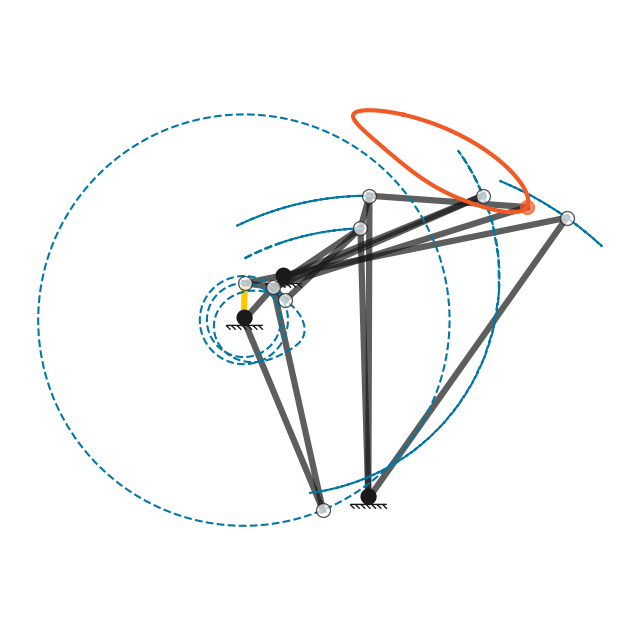

In [52]:
starter_mech = np.load('starter_mechanism.npy',allow_pickle=True).item() #Load mechanism

x0 = starter_mech['x0']
edges = starter_mech['edges']
fixed_joints = starter_mech['fixed_joints']
motor = starter_mech['motor']

plt.figure(figsize=(8,8))
visualizer(x0, edges, fixed_joints, motor, ax=plt.gca())

Besides this starter mechanism, we provide two additional classes called `DifferentiableTools` and `Tools`, which provide you with helpful optimization for this problem. As the names suggest the `DifferentiableTools` provides gradients, if you wish to use gradient based optimization and `Tools` will simply provide the values for the objective functions. Both methods have a `compile` function which will compile the functions for faster and more efficient runs. if you use compile the first run will be slow but then the subsequent runs will speed up. Let's see how they work:

In [53]:
from LINKS.Optimization import DifferentiableTools, Tools

In [54]:
optimization_tools = Tools(
    device='cpu' # device to run the optimization on
)
optimization_tools.compile() # compile the functions for faster runs

gradient_tools = DifferentiableTools(
    device='cpu' # device to run the optimization on
)
gradient_tools.compile() # compile the functions for faster runs

Let's now see how this mechanism does with one of the target curves. We set `target_index` here and **every cell below keys off it** — the curve being fitted, the reference point used for the hypervolume, and the constraint bounds in the optimization problem. Change `target_index` to `0`, `1`, or `2` to switch between the three kangaroos.

In [56]:
# Reference point (hypervolume reference == constraint upper bounds) for each target.
# Kangaroo 3 (the full meme with ears and tail) is much harder, so it gets a looser point.
# These are imported from LINKS.CP so that the values used here are exactly the ones
# evaluate_submission() scores you against -- keeping them in one place avoids drift.
from LINKS.CP import REFERENCE_POINTS

for _i, _rp in enumerate(REFERENCE_POINTS):
    print(f"Problem {_i + 1} ({TARGET_NAMES[_i]}): distance <= {_rp[0]}, material <= {_rp[1]}")

# >>> Switch which kangaroo you are currently working on here (0, 1 or 2). <<<
# Everything downstream (target curve, reference point, constraints) follows this.
target_index = 1

reference_point = REFERENCE_POINTS[target_index]  # reference point for hypervolume calculation

print(f"Working on {TARGET_NAMES[target_index]}")
print(f"Reference point -> distance <= {reference_point[0]}, material <= {reference_point[1]}")

distance, material = optimization_tools(x0,
                                        edges,
                                        fixed_joints,
                                        motor,
                                        target_curves[target_index],
                                        target_idx=None # if you do not specify a target node index, it will automatically use the most complex joint (the last joint in our case)
                                    )

print(f"Distance to target curve {target_index + 1}: {distance:.4f}")
print(f"Material used: {material:.4f}")

Problem 1 (Kangaroo 1 (round body)): distance <= 0.75, material <= 10.0
Problem 2 (Kangaroo 2 (no ears, no tail)): distance <= 1.2, material <= 10.0
Problem 3 (Kangaroo 3 (full meme)): distance <= 1.75, material <= 20.0
Working on Kangaroo 2 (no ears, no tail)
Reference point -> distance <= 1.2, material <= 10.0
Distance to target curve 2: 2.0434
Material used: 14.2079


In [57]:
distance, material, distance_grad, material_grad = gradient_tools(x0,
                                        edges,
                                        fixed_joints,
                                        motor,
                                        target_curves[target_index],
                                        target_idx=None
                                    )

print(f"Distance to target curve {target_index + 1}: {distance:.4f}")
print(f"Material used: {material:.4f}")
print(f"Distance Gradient:\n {distance_grad}\n")
print(f"Material Gradient:\n {material_grad}\n")

Distance to target curve 2: 2.0434
Material used: 14.2079
Distance Gradient:
 [array([  1.5184803, -25.371544 ], dtype=float32), array([-1.639338  ,  0.03979014], dtype=float32), array([-11.379803 ,  -2.1622057], dtype=float32), array([0., 0.], dtype=float32), array([0., 0.], dtype=float32), array([18.85405 , 19.834864], dtype=float32), array([-8.262271 ,  3.3075104], dtype=float32), array([0., 0.], dtype=float32), array([0., 0.], dtype=float32), array([0., 0.], dtype=float32), array([ 0.6063776 , -0.47523442], dtype=float32), array([0.30250505, 4.8268166 ], dtype=float32)]

Material Gradient:
 [array([-2.1489484, -1.6446065], dtype=float32), array([-3.8909743,  1.8862138], dtype=float32), array([-1.1027613, -5.6328998], dtype=float32), array([-1.849906 , -0.7601631], dtype=float32), array([3.1135585, 2.032076 ], dtype=float32), array([-3.8731601,  2.1107216], dtype=float32), array([2.5198495, 2.5694582], dtype=float32), array([-0.09414946, -2.855552  ], dtype=float32), array([ 1.20333

**NOTE:** Both of these classes accept batches of mechanisms for a single target curve. If you pass batches, this will be alot faster, especially running on gpu. In this code to keep things simple we do `ElementwiseProblem` in pymoo, but pymoo supports vectorized problems with the `Problem` class.

Now we will use an approach similar to the demo to define our problem. Note that here we will also add constraints to the problem to remove unacceptable mechanisms. The bounds come from the current target's reference point (`reference_point`), so switching `target_index` automatically switches the constraints too:

In [58]:
# pymoo imports
from pymoo.core.problem import ElementwiseProblem, Problem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.operators.crossover.sbx import SBX
from pymoo.operators.mutation.pm import PolynomialMutation
from pymoo.optimize import minimize

In [60]:
PROBLEM_TOOLS = Tools( # we have to define this outside the class due to pymoo deepcopy limitations
            device='cpu' # device to run the optimization on
        )
PROBLEM_TOOLS.compile() # compile the functions for faster runs

class mechanism_Synthesis_optimization(ElementwiseProblem):

    # When intializing get the mechanism structure which is being optimized
    #(not the initial positions as we are trying to find those)
    def __init__(self, edges, fixed_joints, motor, target_curve, reference_point):

        # set the problem paramters(n_var = number of parameters(number of nodes * 2),
        # n_obj=number of objectives, xl=lower bound for the parameters, xu=upper bound for the paramters)
        super().__init__(n_var = x0.shape[0] * 2, n_obj=2, n_constr=2, xl=0.0, xu=5.0, elementwise_evaluation=True)

        # Store mechanism information for later
        self.edges = edges
        self.fixed_joints = fixed_joints
        self.motor = motor
        self.N = x0.shape[0]

        # Store the target
        self.target_curve = target_curve

        # Store the reference point for this target, which doubles as the
        # constraint upper bounds (distance, material) for this curve
        self.reference_point = np.array(reference_point)

    def _evaluate(self, x, out, *args, **kwargs):
        x0 = np.array(x.reshape([self.N,2]))  #reshape the flattened vector that comes in into 2D array

        # Simulate
        distance, material = PROBLEM_TOOLS(x0,
                                self.edges,
                                self.fixed_joints,
                                self.motor,
                                self.target_curve,
                                target_idx=None # if you do not specify a target node index, it will automatically use the most complex joint (the last joint in our case)
                            )

        out["F"] = np.array([distance, material])
        # Constraints: distance <= reference_point[0], material <= reference_point[1]
        out["G"] = out["F"] - self.reference_point

Now we will run NSGA-II on this problem. Note that the code below replaces the sampling of the algorithm with the initial positions of the pre-defined mechanism. This is an example of population initialization. Becuase this mechanism skeleton is bigger the GA usually struggles to find any valid solutions so this will help start with a better population. This will be discussed in more detail in the advanced notebook. For now let's run this on the curve selected by `target_index`:

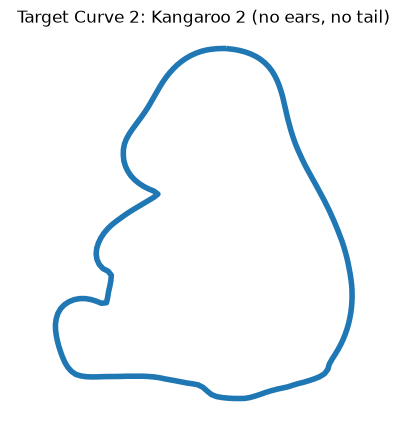

In [61]:
target_curve = np.array(target_curves[target_index])
plt.figure(figsize=(5,5))
plt.plot(target_curve[:,0],target_curve[:,1], lw=4)
plt.axis('equal')
plt.axis('off')
plt.title(f'Target Curve {target_index + 1}: {TARGET_NAMES[target_index]}')
plt.show()

In [62]:
problem = mechanism_Synthesis_optimization(
    edges,
    fixed_joints,
    motor,
    target_curve,
    reference_point
)

# Algorith Parameters
population_size = 100
num_generations = 100

# Initialize a population of duplicates
X = x0[None].repeat(100, axis=0).reshape(population_size, -1)

# Setup the algorithm
algorithm = NSGA2(pop_size=population_size,
                    sampling=X,
                    crossover=SBX(prob=1.0, eta=3.0),
                    mutation=PolynomialMutation(eta=3.0, prob=0.05),
                    eliminate_duplicates=True)

results = minimize(problem,
                   algorithm,
                   ('n_gen', num_generations),
                   verbose=True,
                   save_history=True,
                   seed=0,
                  )

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |        1 |      1 |  5.0512493134 |  5.0512493134 |             - |             -
     2 |       94 |      1 |  3.6531062603 |           INF |             - |             -
     3 |      194 |      1 |  3.6531062603 |  5.5289233267 |             - |             -
     4 |      294 |      1 |  3.5651151419 |  4.7463335958 |             - |             -
     5 |      394 |      1 |  2.9276865005 |  4.2949575412 |             - |             -
     6 |      494 |      1 |  2.0259706259 |  3.7451016414 |             - |             -
     7 |      594 |      1 |  1.8581629276 |  3.3164803460 |             - |             -
     8 |      694 |      1 |  1.0534774542 |  2.7418631172 |             - |             -
     9 |      794 |      1 |  0.9716761589 |  2.1287693276 |             - |             -
    10 |      894 |      1 |  0.9318397522 |  1.7626095681 |             - |             -

AttributeError: module 'numpy' has no attribute 'row_stack'

In [64]:
import numpy as np
import pymoo
import sys

print("Python:", sys.version)
print("NumPy:", np.__version__)
print("pymoo:", pymoo.__version__)

Python: 3.14.5 (main, May 10 2026, 10:21:34) [Clang 17.0.0 (clang-1700.6.4.2)]
NumPy: 2.5.3
pymoo: 0.6.1


Let's visualize the non-dominated solution found by the GA:

In [26]:
from LINKS.Visualization import GAVisualizer

Hyper Volume ~ 1.870604


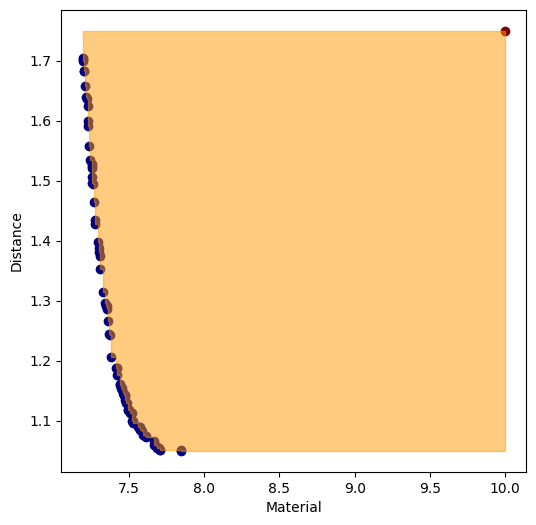

In [27]:
from pymoo.indicators.hv import HV
ga_visualizer = GAVisualizer()

if not results.X is None:
    #Specify reference point
    ref_point = np.array(reference_point)

    #Calculate Hypervolume
    ind = HV(ref_point)
    hypervolume = ind(results.F)

    #Print and plot
    print('Hyper Volume ~ %f' %(hypervolume))
    ga_visualizer.plot_HV(results.F, ref_point, objective_labels=['Distance', 'Material']) #use the plot_HV function from utils
else:
    print('Did Not Find Solutions!!')

Now Let's visualize the best solution for distance

In [28]:
if not results.X is None:
    if type(results.X)!=dict:
        best_idx = np.argmin(results.F[:,0])
        best_sol = results.X[best_idx].reshape(-1,2) # get the solution with the lowest distance to target curve (and reshape it)
    else:
        best_sol = results.X.reshape(-1,2)
else:
    print('Did Not Find Solutions!!')

Distance: 1.0498, Material: 7.8447


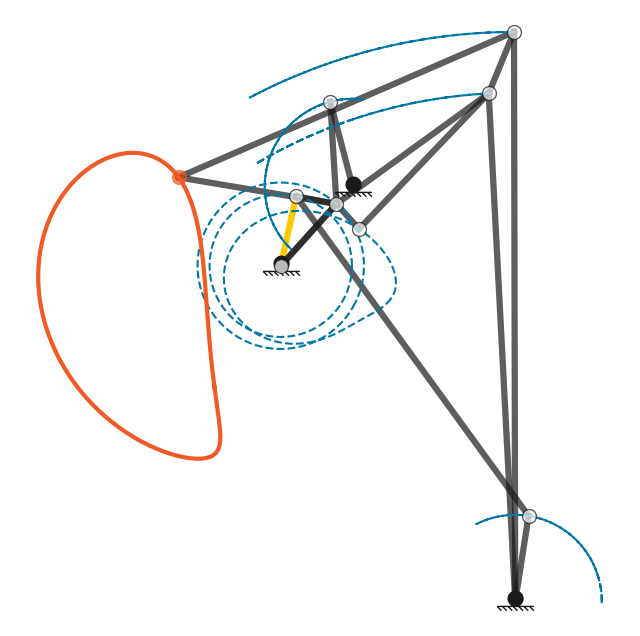

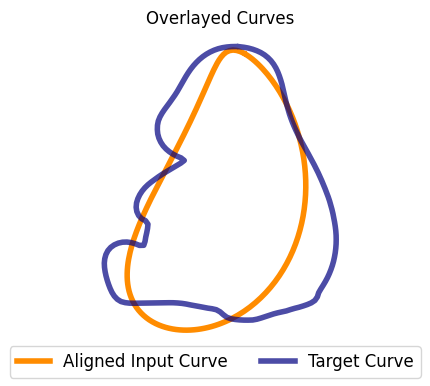

In [29]:
plt.figure(figsize=(8,8))
visualizer(best_sol, edges, fixed_joints, motor, ax=plt.gca())

traced_curve = solver(best_sol, edges, fixed_joints, motor)[-1]
curve_processor.visualize_comparison(
    traced_curve,
    target_curves[target_index]
)

print(f'Distance: {results.F[best_idx,0]:.4f}, Material: {results.F[best_idx,1]:.4f}')

Now let's visualize the best solution for material

In [30]:
if not results.X is None:
    if type(results.X)!=dict:
        best_idx = np.argmin(results.F[:,1])
        best_sol = results.X[best_idx].reshape(-1,2) # get the solution with the lowest distance to target curve (and reshape it)
    else:
        best_sol = results.X.reshape(-1,2)
else:
    print('Did Not Find Solutions!!')

Distance: 1.7048, Material: 7.1925


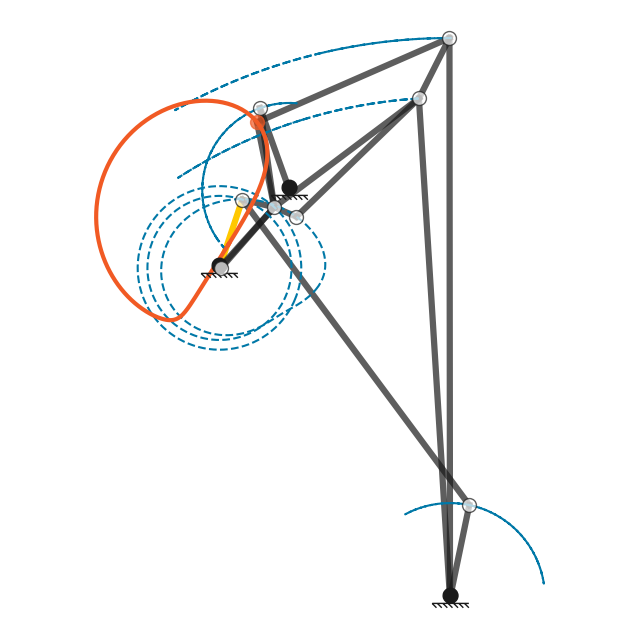

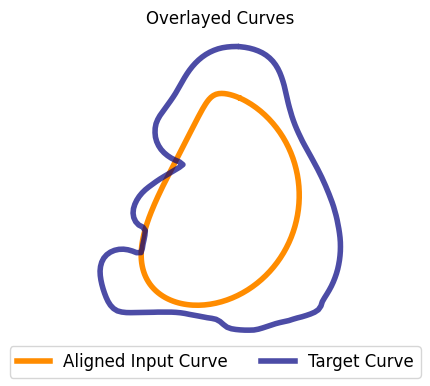

In [31]:
plt.figure(figsize=(8,8))
visualizer(best_sol, edges, fixed_joints, motor, ax=plt.gca())

traced_curve = solver(best_sol, edges, fixed_joints, motor)[-1]
curve_processor.visualize_comparison(
    traced_curve,
    target_curves[target_index]
)

print(f'Distance: {results.F[best_idx,0]:.4f}, Material: {results.F[best_idx,1]:.4f}')

### Submission Format
We want you to submit a single numpy file which includes your solutions to each of the 3 problems. This numpy file will be a standard python dictionary with following format:

```python
submission = {
    'Problem 1': [
        {
            'x0': np.ndarray of shape (N, 2),
            'edges': np.ndarray of shape (E, 2),
            'fixed_joints': np.ndarray of shape (F,),
            'motor': np.ndarray of shape (2,),
            'target_joint': int index of the target node

        },
        ...
    ]
    'Problem 2': [...],
    'Problem 3':[...],
}
```

`Problem 1`, `Problem 2` and `Problem 3` correspond to Kangaroo 1 (round body), Kangaroo 2 (no ears, no tail) and Kangaroo 3 (full meme) respectively — i.e. index `i` of `target_curves` maps to `Problem i+1`.

To make things a bit easier for you, we have provided a few helper functions which will create this dictionary for you. Note that `make_empty_submission()` comes from the shared code base and still creates six `Problem` keys; for this kangaroo version only the first three are used, and the unused keys can simply be left empty. Also note that if you do not provide `target_joint`, during evaluation we will automatically pick the most complex joint (highest index) for evaluation, so be careful to include that if your optimizer picked joints. Finally, if any of the problems are not in your submission dictionary or if the list in the dictionary is empty, a hypervolume of 0 will be assigned to that problem. Your final score is the average hypervolume across the 3 kangaroo problems.

Let's use the solution we just made to make a submission. Since the run above used `target_index`, it goes into `Problem {target_index + 1}`:

In [32]:
from LINKS.CP import make_empty_submission, evaluate_submission

submission = make_empty_submission()

print("Empty Submission:", submission)

Empty Submission: {'Problem 1': [], 'Problem 2': [], 'Problem 3': []}


In [33]:
# add out population to submission
if not results.X is None:
    for i in range(results.X.shape[0]):
        x0_member = results.X[i].reshape(-1,2)

        mech = {
            'x0': x0_member,
            'edges': edges,
            'fixed_joints': fixed_joints,
            'motor': motor,
            'target_joint': None # None means it will automatically use the most complex joint (the last joint in our case)
        }

        # the run above optimized target_index, so it belongs to that problem
        submission[f'Problem {target_index + 1}'].append(mech)

Now let's get our score:

In [34]:
evaluate_submission(submission)

{'Overall Score': 0.6235339272796901,
 'Score Breakdown': {'Problem 1': 0.0,
  'Problem 2': 1.8706017818390706,
  'Problem 3': 0.0}}

We can also visualize the non-dominated samples in the submission population (it will take a while since we have alot of samples to visualize):

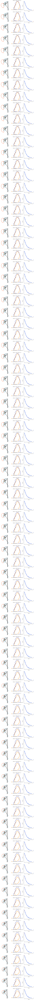

In [35]:
ga_visualizer.plot_pareto_efficient(
    F=results.F,
    population=submission[f'Problem {target_index + 1}'],
    target_curve=target_curve,
    objective_labels=['Distance', 'Material']
)

In your submission we expect a single numpy file. Below is some code to save this submission as a numpy file:

**NOTE:** the submission we just built contains results for **only one problem** (`Problem {target_index + 1}`), because we only ran the GA on the curve selected by `target_index`. The other problems are still empty, so `evaluate_submission` will report **0.0** for them and your overall score will be low. That is expected at this stage — the full submission covering all three kangaroos is built further down in "Let's get a full submission going".

In [36]:
np.save('my_submission.npy', submission) # This will save your submission in the current directory

You can call the `evaluate_submission` functions with file paths too:

In [37]:
evaluate_submission(
    submission='my_submission.npy',
    target_curves='kangaroo_target_curves.npy'
)

{'Overall Score': 0.6235339272796901,
 'Score Breakdown': {'Problem 1': 0.0,
  'Problem 2': 1.8706017818390706,
  'Problem 3': 0.0}}

When you are submitting to the scoreboard you will need to upload the submission numpy file.

### Let's get a full submission going
Now we will run the GA for each target curve seperately and get a full submission going. Note that the loop picks up each curve's own reference point from `REFERENCE_POINTS`, so Kangaroo 3 is optimized and scored against its looser bounds:

Optimizing for Problem 1 (Kangaroo 1 (round body)), reference point [0.75, 10.0]. Please Wait...
Optimizing for Problem 2 (Kangaroo 2 (no ears, no tail)), reference point [1.75, 10.0]. Please Wait...
Optimizing for Problem 3 (Kangaroo 3 (full meme)), reference point [1.75, 20.0]. Please Wait...


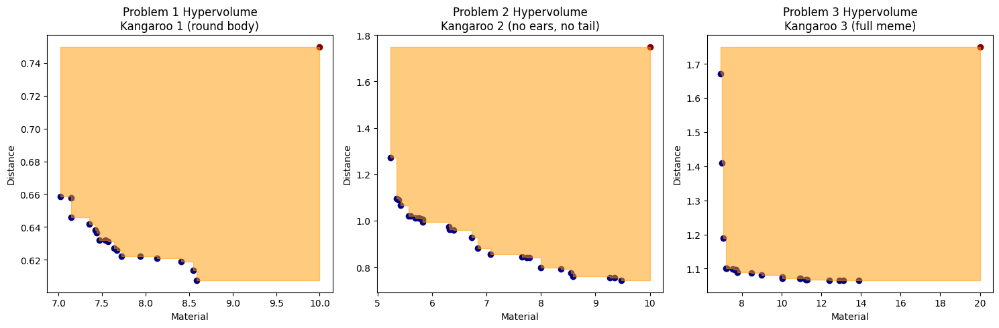

In [38]:
submission = make_empty_submission()
full_results = submission.copy()

population_size = 200
num_generations = 50

n_targets = target_curves.shape[0]

for i in range(n_targets):

    # each target has its own reference point / constraint bounds
    ref_point_i = REFERENCE_POINTS[i]

    print(f"Optimizing for Problem {i+1} ({TARGET_NAMES[i]}), "
          f"reference point {ref_point_i.tolist()}. Please Wait...")

    problem = mechanism_Synthesis_optimization(
        edges,
        fixed_joints,
        motor,
        target_curves[i],
        ref_point_i
    )

    X = x0[None].repeat(population_size, axis=0).reshape(population_size, -1)
    # Setup the algorithm
    algorithm = NSGA2(pop_size=population_size,
                        sampling=X,
                        crossover=SBX(prob=1.0, eta=3.0),
                        mutation=PolynomialMutation(eta=3.0, prob=0.9),
                        eliminate_duplicates=True)

    results = minimize(problem,
                    algorithm,
                    ('n_gen', num_generations),
                    verbose=False,
                    save_history=True,
                    seed=123,
                    )

    if results.X is None:
        print('Did Not Find Solutions!!')
    else:
        for j in range(results.X.shape[0]):
            x0_member = results.X[j].reshape(-1,2)

            mech = {
                'x0': x0_member,
                'edges': edges,
                'fixed_joints': fixed_joints,
                'motor': motor,
                'target_joint': None # None means it will automatically use the most complex joint (the last joint in our case)
            }

            submission[f'Problem {i+1}'].append(mech)
            full_results[f'Problem {i+1}'] = results


# now let's evaluate the pareto efficient solutions for all problems
plt.subplots(1, n_targets, figsize=(5 * n_targets, 5))
for i in range(n_targets):
    if isinstance(full_results[f'Problem {i+1}'], list) or full_results[f'Problem {i+1}'].X is None:
        print(f'Did Not Find Solutions for Problem {i+1}!!')
        plt.subplot(1, n_targets, i+1)
        plt.text(0.5, 0.5, 'No Solutions Found', horizontalalignment='center', verticalalignment='center', fontsize=12)
        plt.axis('off')
        continue
    ga_visualizer.plot_HV(
        F=full_results[f'Problem {i+1}'].F,
        ref=REFERENCE_POINTS[i],  # each target is scored against its own reference point
        ax=plt.subplot(1, n_targets, i+1),
        objective_labels=['Distance', 'Material']
    )
    plt.title(f'Problem {i+1} Hypervolume\n{TARGET_NAMES[i]}')
plt.tight_layout()

In [39]:
evaluate_submission(submission)

{'Overall Score': 4.456898310400305,
 'Score Breakdown': {'Problem 1': 0.39020188582222204,
  'Problem 2': 4.187699284355915,
  'Problem 3': 8.792793761022779}}

Now we can save this submission and submit it to the leader board.

In [ ]:
np.save('my_full_submission.npy', submission) # This will save your submission in the current directory